In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
data = pd.read_csv('C:/Users/Dell/Desktop/Test task/train.csv')
data.head()

,VASK0,VASK1,VASK2,VASK3,VASK4,VBID0,VBID1,VBID2,VBID3,VBID4,...,VASK1_PREV,VASK2_PREV,VASK3_PREV,VASK4_PREV,VBID0_PREV,VBID1_PREV,VBID2_PREV,VBID3_PREV,VBID4_PREV,Y
0,108,276,224,196,195,132,181,253,207,185,...,276,224,196,195,136,181,253,207,185,0
1,47,132,197,236,188,81,146,193,169,192,...,132,197,236,188,81,146,193,169,192,0
2,93,172,193,226,232,33,128,168,145,140,...,172,193,226,232,33,128,168,145,140,0
3,62,104,169,188,140,75,165,151,206,105,...,104,169,188,140,81,165,151,206,105,0
4,40,43,87,110,99,11,66,77,155,364,...,43,87,110,99,11,66,77,153,364,0


In [ ]:
data.describe()

,VASK0,VASK1,VASK2,VASK3,VASK4,VBID0,VBID1,VBID2,VBID3,VBID4,...,VASK1_PREV,VASK2_PREV,VASK3_PREV,VASK4_PREV,VBID0_PREV,VBID1_PREV,VBID2_PREV,VBID3_PREV,VBID4_PREV,Y
count,186590.000000,186590.000000,186590.000000,186590.000000,186590.000000,186590.000000,186590.000000,186590.000000,186590.000000,186590.000000,...,186590.000000,186590.000000,186590.000000,186590.000000,186590.000000,186590.000000,186590.000000,186590.000000,186590.000000,186590.000000
mean,92.788981,178.840495,204.462640,205.277978,202.079436,92.270245,177.477716,203.058487,202.174195,197.799646,...,178.796431,204.430945,205.273975,202.076333,92.318286,177.438491,203.023479,202.169194,197.795123,0.010258
std,66.491713,62.138222,62.969816,65.644839,67.571850,65.281200,59.409587,58.546985,59.286325,61.265705,...,62.173445,62.981647,65.646947,67.573708,65.376130,59.444964,58.557993,59.289762,61.263966,0.100760
min,1.000000,1.000000,5.000000,1.000000,9.000000,1.000000,1.000000,1.000000,4.000000,3.000000,...,1.000000,5.000000,1.000000,9.000000,1.000000,1.000000,1.000000,4.000000,3.000000,0.000000
25%,41.000000,138.000000,162.000000,161.000000,156.000000,40.000000,137.000000,162.000000,161.000000,156.000000,...,138.000000,162.000000,161.000000,156.000000,40.000000,136.000000,162.000000,161.000000,156.000000,0.000000
50%,83.000000,170.000000,196.000000,194.000000,189.000000,83.000000,170.000000,197.000000,195.000000,188.000000,...,170.000000,196.000000,194.000000,189.000000,83.000000,170.000000,197.000000,195.000000,188.000000,0.000000
75%,131.000000,210.000000,232.000000,234.000000,232.000000,132.000000,211.000000,234.000000,233.000000,228.000000,...,210.000000,232.000000,234.000000,232.000000,132.000000,211.000000,234.000000,233.000000,228.000000,0.000000
max,647.000000,784.000000,666.000000,813.000000,738.000000,593.000000,657.000000,683.000000,687.000000,718.000000,...,784.000000,666.000000,813.000000,738.000000,593.000000,657.000000,683.000000,687.000000,718.000000,1.000000


In most columns, there are some outliers, but I choose not to remove them. No feature separates classes linearly

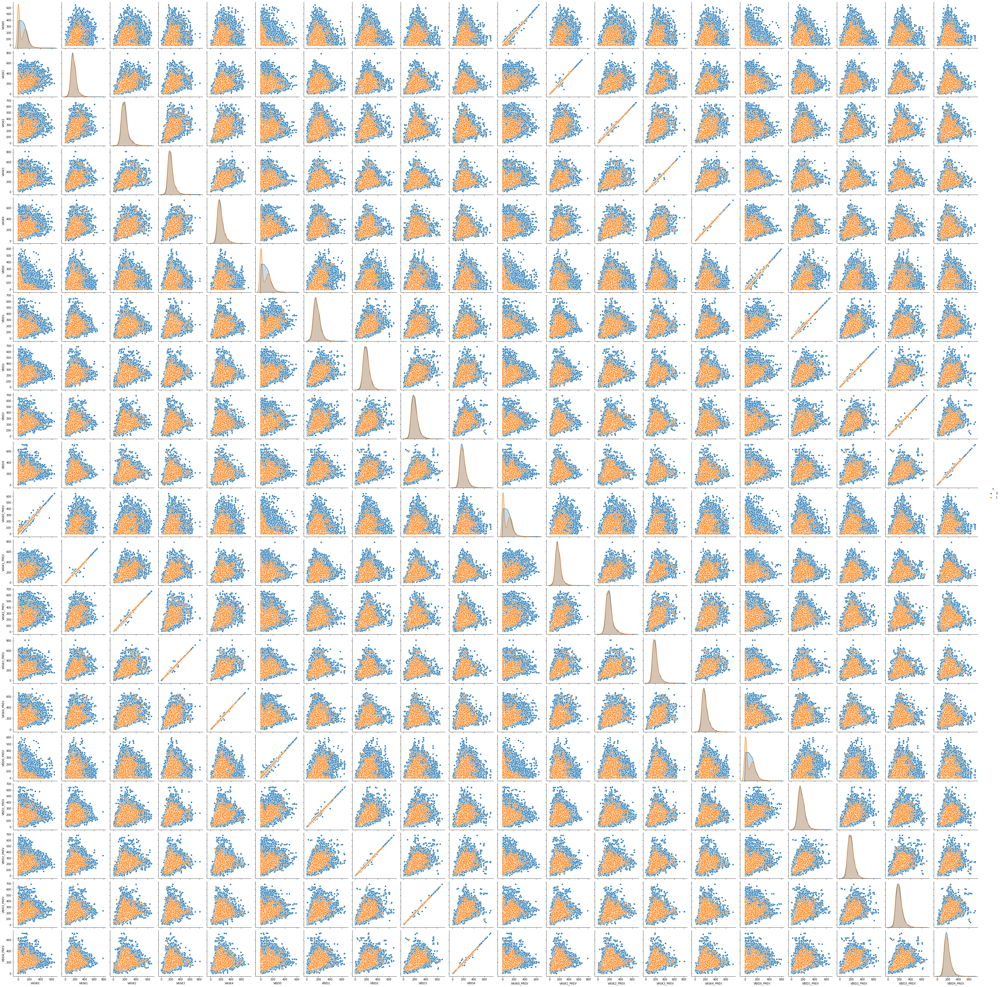

In [ ]:
sns.pairplot(data, hue = 'Y'); 

Classses are most distinct based on VASK0 and VBID0, at other levels the distribution is visually rather similar. There are a lot of observations of class 1 with low first-level volume. Distribution of first level volumes is also different from distribution of volumes at other levels.

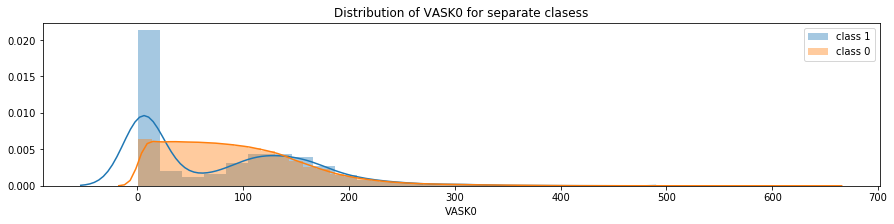

In [ ]:
plt.figure(figsize = (15, 3))
sns.distplot(data[data['Y'] == 1].iloc[:,0], label = 'class 1')
sns.distplot(data[data['Y'] == 0].iloc[:,0], label = 'class 0')
plt.title('Distribution of VASK0 for separate clasess')
plt.legend();

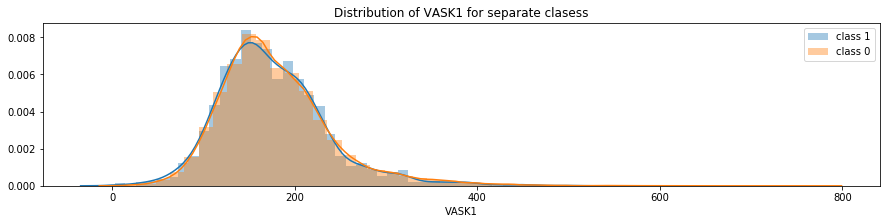

In [ ]:
plt.figure(figsize = (15, 3))
sns.distplot(data[data['Y'] == 1].iloc[:,1], label = 'class 1')
sns.distplot(data[data['Y'] == 0].iloc[:,1], label = 'class 0')
plt.title('Distribution of VASK1 for separate clasess')
plt.legend();

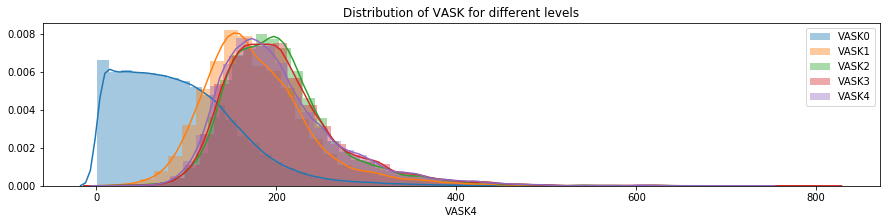

In [ ]:
plt.figure(figsize = (15, 3))
for i in data.columns[:5]:
    sns.distplot(data[i], label= i)
plt.title('Distribution of VASK for different levels')
plt.legend();

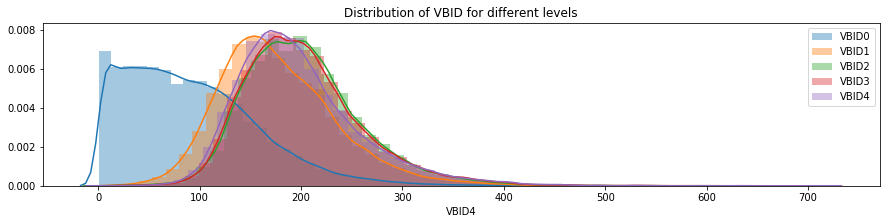

In [ ]:
plt.figure(figsize = (15, 3))
for i in data.columns[5:10]:
    sns.distplot(data[i], label= i)
plt.title('Distribution of VBID for different levels')
plt.legend();

As the correlation between some features is high, they are likely to be collinear. We might want to drop some of these features or aggregate them somehow.

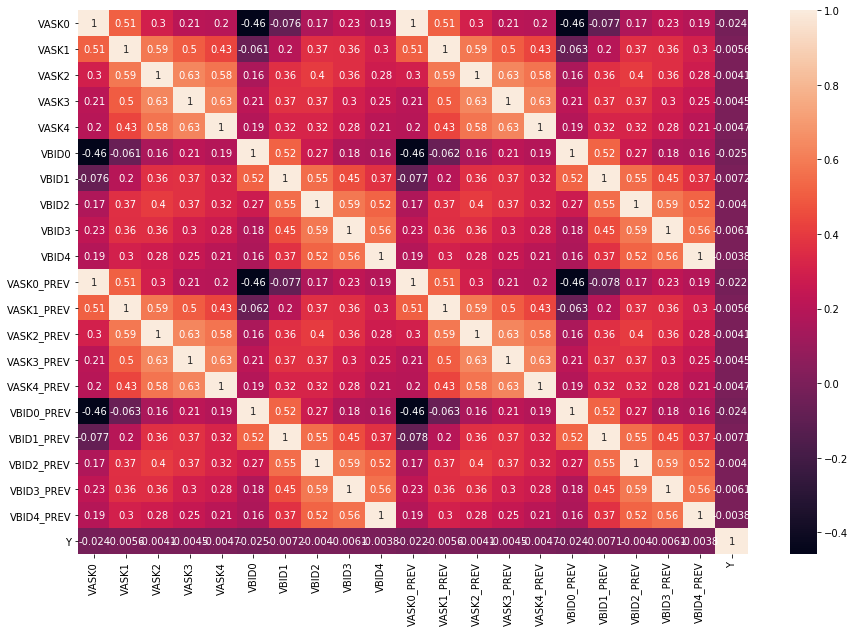

In [ ]:
plt.figure(figsize = (15, 10))
sns.heatmap(data.corr(), annot=True);

Class 1 occured when trading volume on bid and ask sides was rather low. This may be explained by the fact that as trading volume falls, liquidity is lower, and bid-ask spread (which can be seen as liquidity indicator) is allowed to widen. To account for this, we can introduce dummy variable equal to one if bid and/or ask volume is less than some small number.

''

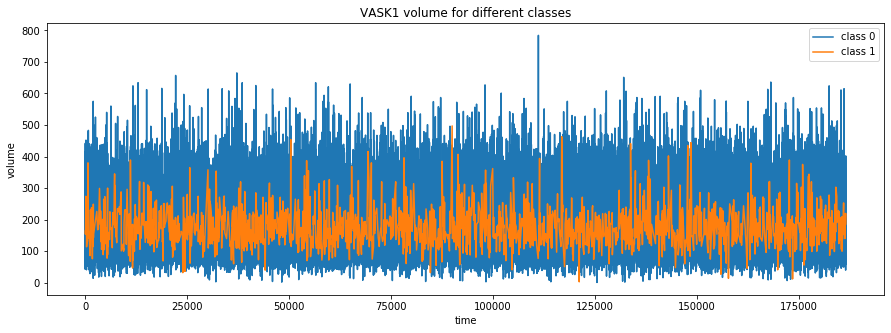

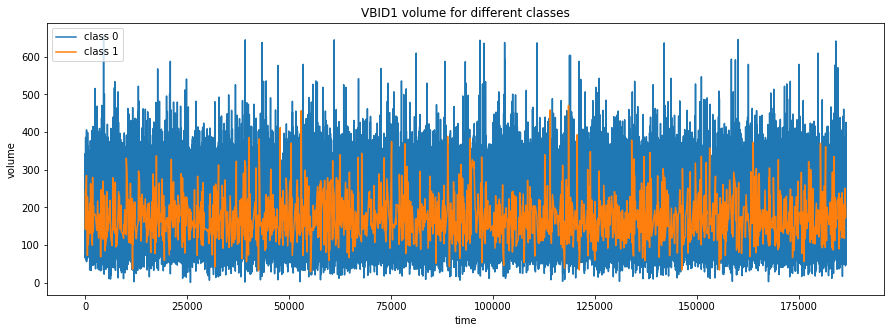

In [ ]:
#Similar pattern on other levels
plt.figure(figsize = (15,5))
plt.plot(data[data['Y'] == 0].index, data[data['Y'] == 0]['VASK1'], label = 'class 0')
plt.plot(data[data['Y'] == 1].index, data[data['Y'] == 1]['VASK1'], label = 'class 1')
plt.title('VASK1 volume for different classes')
plt.xlabel('time')
plt.ylabel('volume')
plt.legend();

plt.figure(figsize = (15,5))
plt.plot(data[data['Y'] == 0].index, data[data['Y'] == 0]['VBID1'], label = 'class 0')
plt.plot(data[data['Y'] == 1].index, data[data['Y'] == 1]['VBID1'], label = 'class 1')
plt.xlabel('time')
plt.ylabel('volume')
plt.legend()
plt.title('VBID1 volume for different classes')
;

It can be seen that datasets are unbalanced, since there is much smaller number of records for class 1. 

In [ ]:
print('For class 0, there are {} records'.format(data[data['Y'] == 0].shape[0]))
print('For class 1, there are {} records'.format(data[data['Y'] == 1].shape[0]))
print('If class 0 was always predicted, accuracy would be {}%'.format(round(1914 *100 / 184676, 4)))

For class 0, there are 184676 records
For class 1, there are 1914 records
If class 0 was always predicted, accuracy would be 1.0364%


Further, I check for stationarity with Augmented Dickey-Fuller test (in case I will consider time series models). There does not seem to be any trend in the data, so I use specification without trend. P-value is 0, so null hypothesis of non-stationarity is rejected at any reasonable significance level. But as this test has low power, I also check with KPSS test (null hypothesis is stationarity). KPSS does not reject non-stationarity. It is reasonable to conlude that all other time series are stationary as well, so we can proceed with prediction.

In [ ]:
from statsmodels.tsa.stattools import adfuller, kpss
adfuller(data['VBID0'], regression = 'c', autolag = 'BIC', store = True)

(-431.39791855234404,
 0.0,
 {'1%': -3.4303850470283064,
  '5%': -2.8615554903166465,
  '10%': -2.5667782449397043},
 <statsmodels.stats.diagnostic.ResultsStore at 0x233841e0c88>)

In [ ]:
kpss(data['VBID0'], regression = 'c', nlags = 'auto', store = True)

C:\Users\Dell\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1886: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warn_msg.format(direction="greater"), InterpolationWarning


(0.04655202445488565,
 0.1,
 {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739},
 <statsmodels.stats.diagnostic.ResultsStore at 0x23393790a48>)

I also do Ljung-Box test to find if there is any autocorrelation up to 1st, 5th and 10th lags. Null hypothesis of no autocorrelation is not rejected at any reasonable significance levels. Hence, we might work with this data as cross-sectional.

In [ ]:
import statsmodels.api as sm
print(sm.stats.acorr_ljungbox(data['VASK0'], lags=[10], return_df=True))
print(sm.stats.acorr_ljungbox(data['VASK0'], lags=[5], return_df=True))
print(sm.stats.acorr_ljungbox(data['VASK0'], lags=[1], return_df=True))

      lb_stat  lb_pvalue
10  11.799469   0.298702
    lb_stat  lb_pvalue
5  5.258696   0.385131
    lb_stat  lb_pvalue
1  0.000047   0.994543


In 86% of observations of class 1, there is a level at which volume is less than 20, which is not characteristic of class 0. This is a sign of lack of liquidity at some level.

In [ ]:
data1 = data[data['Y'] == 1].drop(columns = ['Y'])
count = 0
for row in range(data1.shape[0]):
    if sum(data1.iloc[row, :] < 20) == 0:
        count += 1
1 - count / data1.shape[0]

0.8631138975966562

In [ ]:
data1 = data.drop(columns = ['Y'])
count = 0
for row in range(data.shape[0]):
    if sum(data.iloc[row, :] < 20) == 0:
        count += 1
1 - count / data.shape[0]

1.0

Here I transform features for current volumes as ASK - BID. The pattern is the same (the difference is lower for class 1), so we might consider using this as features to reduce dimensionality.

In [ ]:
data_diff = dict()
for col in range(5):
    data_diff['DIFF'+str(col)] = data.iloc[:, col] - data.iloc[:, col + 5]
data_diff['Y']=data['Y']

In [ ]:
data_diff = pd.DataFrame(data_diff)
data_diff.head()

,DIFF0,DIFF1,DIFF2,DIFF3,DIFF4,Y
0,-24,95,-29,-11,10,0
1,-34,-14,4,67,-4,0
2,60,44,25,81,92,0
3,-13,-61,18,-18,35,0
4,29,-23,10,-45,-265,0


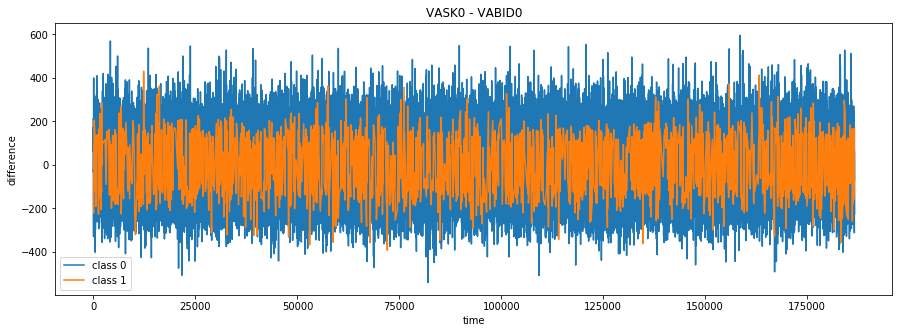

In [ ]:
plt.figure(figsize = (15,5))
plt.plot(data_diff[data_diff['Y'] == 0].iloc[:, 0], label = 'class 0')
plt.plot(data_diff[data_diff['Y'] == 1].iloc[:, 0], label = 'class 1')
plt.title('VASK0 - VABID0')
plt.xlabel('time')
plt.ylabel('difference')
plt.legend();

Further, I consider additional features - volatility  and mean for last 5 moments and difference between volumes at the same level. This is done for VASK0, but for other levels and bid volumes the pattern is the same - the features are less in value for class 1.

In [ ]:
data['vol'] = 0
for i in range(5, data.shape[0] + 1):
    data['vol'][i-1] = data.iloc[i-5:i, 0].std()

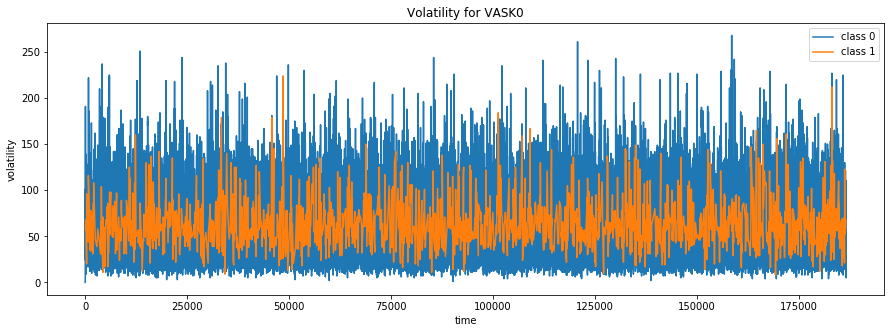

In [ ]:
plt.figure(figsize = (15,5))
plt.plot(data[data['Y'] == 0].loc[:,'vol'], label = 'class 0')
plt.plot(data[data['Y'] == 1].loc[:,'vol'], label = 'class 1')
plt.title('Volatility for VASK0')
plt.xlabel('time')
plt.ylabel('volatility')
plt.legend();

In [ ]:
data['mean'] = 0
for i in range(5, data.shape[0] + 1):
    data['mean'][i-1] = data.iloc[i-5:i, 0].mean()

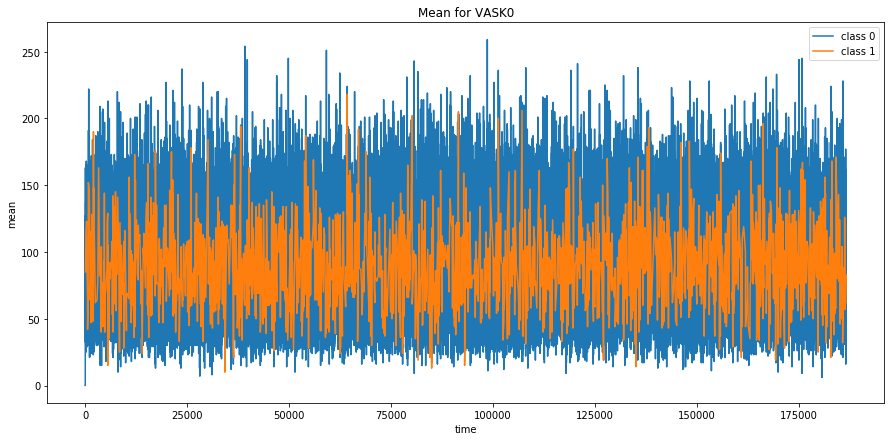

In [ ]:
plt.figure(figsize = (15,7))
plt.plot(data[data['Y'] == 0].loc[:,'mean'], label = 'class 0')
plt.plot(data[data['Y'] == 1].loc[:,'mean'], label = 'class 1')
plt.title('Mean for VASK0')
plt.xlabel('time')
plt.ylabel('mean')
plt.legend();

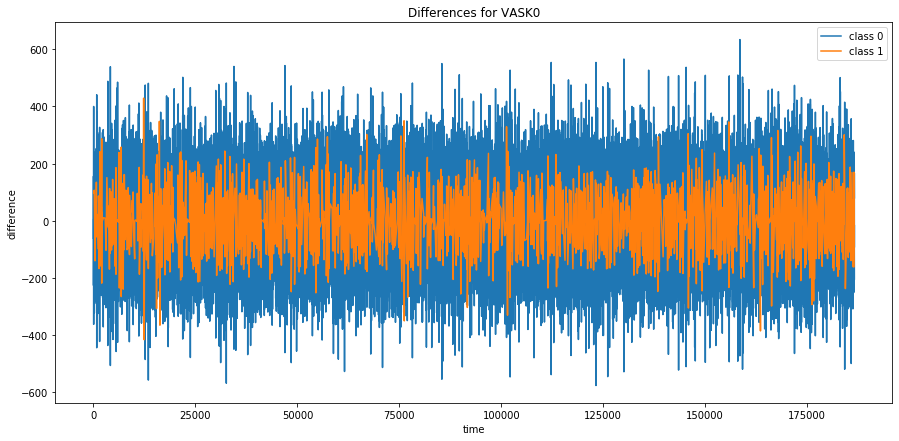

In [ ]:
plt.figure(figsize = (15,7))
plt.plot(data[data['Y'] == 0].iloc[:, 0].diff(), label = 'class 0')
plt.plot(data[data['Y'] == 1].iloc[:, 0].diff(), label = 'class 1')
plt.title('Differences for VASK0')
plt.xlabel('time')
plt.ylabel('difference')
plt.legend();